<a href="https://colab.research.google.com/github/PK125-nsfh/cert/blob/main/DEM_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Brute Force Approach

In [ ]:
!pip install rasterio numpy matplotlib scipy networkx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 89.0 MB/s eta 0:00:00


Elevation data loaded, shape: (3601, 3601)
Slope and cost calculated on GPU, transferred to CPU for routing
Path computed, length: 4031, total cost: 8001.92


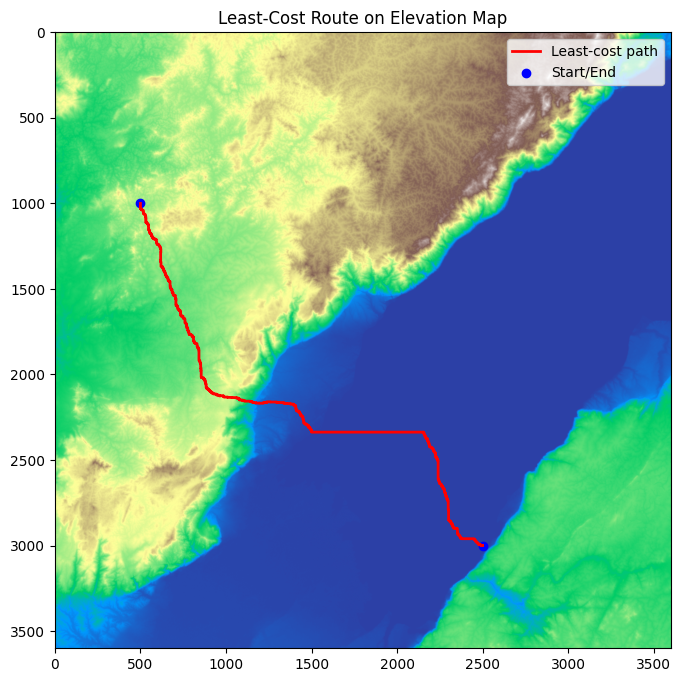

In [ ]:
import rasterio
import cupy as cp
import numpy as np
import matplotlib.pyplot as plt
from skimage.graph import route_through_array

# Load .hgt elevation data (as numpy array)
with rasterio.open("N01E030.hgt") as src:
    elevation = src.read(1).astype(float)
    transform = src.transform

print("Elevation data loaded, shape:", elevation.shape)

# Transfer elevation data to GPU (CuPy array)
elevation_gpu = cp.asarray(elevation)

# Calculate slope on GPU using gradient approximation
dx = cp.gradient(elevation_gpu, axis=1)
dy = cp.gradient(elevation_gpu, axis=0)
slope_gpu = cp.sqrt(dx**2 + dy**2)

# Create cost surface: cost increases with slope
cost_gpu = 1 + slope_gpu  # simple cost model

# Transfer cost back to CPU (numpy) for pathfinding
cost = cp.asnumpy(cost_gpu)

print("Slope and cost calculated on GPU, transferred to CPU for routing")

# Define start and end points in (row, col) pixel coordinates
# Adjust these according to your needs or convert from lat/lon with src.index()
start = (1000, 500)  # example start pixel
end = (3000, 2500)   # example end pixel

# Compute least-cost path using scikit-image on CPU
indices, weight = route_through_array(cost, start, end, fully_connected=False)

path_y, path_x = zip(*indices)

print(f"Path computed, length: {len(indices)}, total cost: {weight:.2f}")

# Visualize elevation with route overlay
plt.figure(figsize=(10, 8))
plt.imshow(elevation, cmap='terrain')
plt.plot(path_x, path_y, color='red', linewidth=2, label='Least-cost path')
plt.scatter([start[1], end[1]], [start[0], end[0]], color='blue', marker='o', label='Start/End')
plt.title("Least-Cost Route on Elevation Map")
plt.legend()
plt.show()


Elevation data loaded, shape: (3601, 3601)
Slope and cost surface calculated on GPU
Start pixel: (3600, 0), End pixel: (3600, 0)
Path computed, length: 1, total cost: 0.00


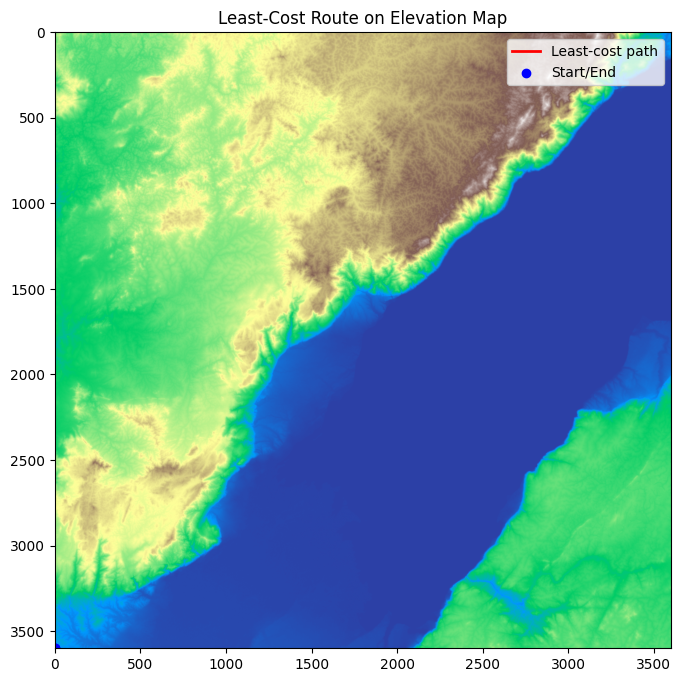

✅ GPX file saved as 'least_cost_route.gpx'


In [ ]:
import rasterio
import cupy as cp
import numpy as np
import matplotlib.pyplot as plt
from skimage.graph import route_through_array
from xml.dom.minidom import Document

# === Step 1: Load elevation data ===
with rasterio.open("N01E030.hgt") as src:
    elevation = src.read(1).astype(float)
    transform = src.transform  # affine transform for pixel<->geo
    print("Elevation data loaded, shape:", elevation.shape)

# === Step 2: Calculate slope and cost surface using CuPy (GPU) ===
elevation_gpu = cp.asarray(elevation)
dx = cp.gradient(elevation_gpu, axis=1)
dy = cp.gradient(elevation_gpu, axis=0)
slope_gpu = cp.sqrt(dx**2 + dy**2)
cost_gpu = 1 + slope_gpu
cost = cp.asnumpy(cost_gpu)
print("Slope and cost surface calculated on GPU")

# === Step 3: Lat/Lon to Pixel conversion (corrected) ===
def latlon_to_pixel(lat, lon, raster_src):
    row, col = raster_src.index(lon, lat)  # Correct order: lon, lat
    return int(row), int(col)

# === Step 4: Clamp pixel coordinates to stay in bounds ===
def clamp_pixel_coords(coord, shape):
    row, col = coord
    row = min(max(row, 0), shape[0] - 1)
    col = min(max(col, 0), shape[1] - 1)
    return (row, col)

# === Step 5: Set lat/lon coordinates ===
start_lat, start_lon = 0.2, 13.2
end_lat, end_lon = 0.8, 13.8

# Convert to pixels and clamp
start = latlon_to_pixel(start_lat, start_lon, src)
end = latlon_to_pixel(end_lat, end_lon, src)
start = clamp_pixel_coords(start, cost.shape)
end = clamp_pixel_coords(end, cost.shape)
print(f"Start pixel: {start}, End pixel: {end}")

# === Step 6: Route computation using scikit-image ===
indices, weight = route_through_array(cost, start, end, fully_connected=False)
path_y, path_x = zip(*indices)
print(f"Path computed, length: {len(indices)}, total cost: {weight:.2f}")

# === Step 7: Visualize elevation + route ===
plt.figure(figsize=(10, 8))
plt.imshow(elevation, cmap='terrain')
plt.plot(path_x, path_y, color='red', linewidth=2, label='Least-cost path')
plt.scatter([start[1], end[1]], [start[0], end[0]], color='blue', marker='o', label='Start/End')
plt.title("Least-Cost Route on Elevation Map")
plt.legend()
plt.show()

# === Step 8: Convert pixel to lat/lon for GPX export ===
def pixel_to_latlon(row, col, src_transform):
    lon, lat = src_transform * (col, row)
    return lat, lon

# === Step 9: Create and save GPX file ===
def create_gpx(path_pixels, src_transform, filename="least_cost_route.gpx"):
    doc = Document()
    gpx = doc.createElement("gpx")
    gpx.setAttribute("version", "1.1")
    gpx.setAttribute("creator", "ElevationRoutePlanner")
    doc.appendChild(gpx)

    trk = doc.createElement("trk")
    gpx.appendChild(trk)

    name = doc.createElement("name")
    name.appendChild(doc.createTextNode("Least Cost Route"))
    trk.appendChild(name)

    trkseg = doc.createElement("trkseg")
    trk.appendChild(trkseg)

    for (row, col) in path_pixels:
        lat, lon = pixel_to_latlon(row, col, src_transform)
        trkpt = doc.createElement("trkpt")
        trkpt.setAttribute("lat", f"{lat:.7f}")
        trkpt.setAttribute("lon", f"{lon:.7f}")
        trkseg.appendChild(trkpt)

    with open(filename, "w") as f:
        f.write(doc.toprettyxml(indent="  "))
    print(f"✅ GPX file saved as '{filename}'")

# Export to GPX
create_gpx(indices, transform, "least_cost_route.gpx")


#Approach 1 : Dijkstra on Raster

In [ ]:
!pip install cugraph-cu11

In [ ]:
!pip install cudf-cu12

In [ ]:
import rasterio
import cupy as cp
import cudf
import cugraph
import numpy as np

# Load DEM and create cost surface
with rasterio.open("N01E030.hgt") as src:
    elevation = src.read(1).astype(np.float32)
    transform = src.transform
    nodata = src.nodata

    if nodata is not None:
        elevation[elevation == nodata] = np.nan
    elevation = np.nan_to_num(elevation, nan=0)

    rows, cols = elevation.shape
    elevation_gpu = cp.asarray(elevation)

    # Gradient = slope approximation
    dx = cp.gradient(elevation_gpu, axis=1)
    dy = cp.gradient(elevation_gpu, axis=0)
    slope = cp.sqrt(dx**2 + dy**2)

    cost = 1 + slope
    cost = cp.asnumpy(cost)

# Build graph edges (4-connected grid)
def build_graph(cost):
    rows, cols = cost.shape
    edges = []

    def node(r, c):
        return r * cols + c

    for r in range(rows):
        for c in range(cols):
            cur = node(r, c)
            if c < cols - 1:
                edges.append((cur, node(r, c+1), cost[r, c+1]))
                edges.append((node(r, c+1), cur, cost[r, c]))
            if r < rows - 1:
                edges.append((cur, node(r+1, c), cost[r+1, c]))
                edges.append((node(r+1, c), cur, cost[r, c]))
    return np.array(edges)

print("Building graph...")
edges_np = build_graph(cost)
df = cudf.DataFrame(edges_np, columns=["src", "dst", "weight"])

# Run Dijkstra
start_rc = (1000, 500)
end_rc = (3000, 2500)

start = start_rc[0] * cols + start_rc[1]
end = end_rc[0] * cols + end_rc[1]

print("Running Dijkstra on GPU...")
dijkstra_df = cugraph.sssp(df, source=start)
path = []

# Backtrack path from end node
current = end
while current != start:
    row = dijkstra_df[dijkstra_df['vertex'] == current]
    if row.empty:
        break
    current = int(row['predecessor'])
    path.append(current)

path = list(reversed(path))

# Convert node indices back to (row, col)
path_rc = [(p // cols, p % cols) for p in path]

# Visualize
import matplotlib.pyplot as plt

plt.imshow(elevation, cmap='terrain')
path_y, path_x = zip(*path_rc)
plt.plot(path_x, path_y, color='red')
plt.scatter([start_rc[1], end_rc[1]], [start_rc[0], end_rc[0]], c='blue')
plt.title("GPU Dijkstra Path")
plt.show()


#Approach 2 : FMM (Fast Marching Method)

In [ ]:
!pip install scikit-fmm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 467.5/467.5 kB 9.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for scikit-fmm: filename=scikit_fmm-2025.1.29-cp311-cp311-linux_x86_64.whl size=76754 sha256=045c4f66779ed02696b88dc44d20a948d6e5772965080ef1271cb6471c8fa06e
  Stored in directory: /root/.cache/pip/wheels/14/05/7a/0787c9284f280d618f37accc667b55f8016549811850d43a9b
Successfully built scikit-fmm


Running Fast Marching Method...
Total path length: 3276.10 pixels
Total cost along the path: 6868.23


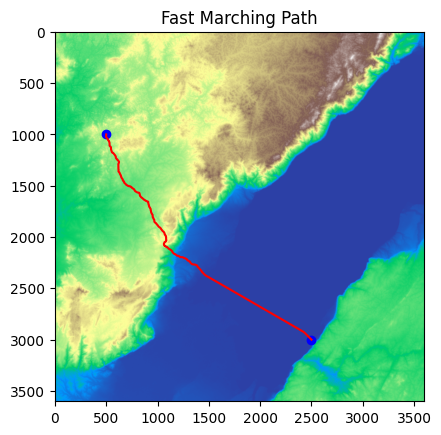

In [10]:
import rasterio
import numpy as np
import skfmm
import matplotlib.pyplot as plt

# Load elevation data
with rasterio.open("N01E030.hgt") as src:
    elevation = src.read(1).astype(np.float32)
    transform = src.transform
    nodata = src.nodata

    if nodata is not None:
        elevation[elevation == nodata] = np.nan
    elevation = np.nan_to_num(elevation, nan=0)

    rows, cols = elevation.shape

# Compute slope as cost (you could enhance this)
dy, dx = np.gradient(elevation)
slope = np.sqrt(dx**2 + dy**2)
cost = 1 + slope

# Define source point for arrival map
start = (1000, 500)
mask = np.ones_like(elevation, dtype=bool)
mask[start] = False  # set source

# Use inverse cost as speed
speed = 1 / (cost + 1e-6)  # Avoid divide-by-zero
speed = np.where(speed <= 0, 1e-6, speed)

# Compute arrival time from source
print("Running Fast Marching Method...")
arrival_time = skfmm.travel_time(mask.astype(float), speed)

# Define target point
end = (3000, 2500)

# Backtrace shortest arrival path
def backtrace_path(arrival, start, end, step_size=1.0):
    from scipy.ndimage import map_coordinates

    path = [end]
    y, x = end

    for _ in range(10000):  # max iterations
        gy, gx = np.gradient(arrival)
        norm = np.hypot(gx[y, x], gy[y, x])
        if norm == 0:
            break

        dx = -gx[y, x] / norm
        dy = -gy[y, x] / norm

        x_new = x + dx * step_size
        y_new = y + dy * step_size

        if not (0 <= x_new < arrival.shape[1] and 0 <= y_new < arrival.shape[0]):
            break

        x, y = int(round(x_new)), int(round(y_new))
        path.append((y, x))

        if (y, x) == start:
            break

    return path[::-1]

path = backtrace_path(arrival_time, start, end)

# Calculate total cost and path length
total_cost = 0.0
total_length = 0.0

for (y0, x0), (y1, x1) in zip(path[:-1], path[1:]):
    segment_cost = (cost[y0, x0] + cost[y1, x1]) / 2  # average cost of segment
    segment_length = np.hypot(y1 - y0, x1 - x0)  # Euclidean distance
    total_cost += segment_cost * segment_length
    total_length += segment_length

print(f"Total path length: {total_length:.2f} pixels")
print(f"Total cost along the path: {total_cost:.2f}")


# Visualize
plt.imshow(elevation, cmap='terrain')
path_y, path_x = zip(*path)
plt.plot(path_x, path_y, color='red')
plt.scatter([start[1], end[1]], [start[0], end[0]], c='blue')
plt.title("Fast Marching Path")
plt.show()


Running Fast Marching Method...


<ipython-input-5-26898d4dc63c>:78: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffered_pts = path_points.buffer(0.0002)


FMM Path length: 2703
Transport points: 393, Water points: 35


<ipython-input-5-26898d4dc63c>:114: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-5-26898d4dc63c>:114: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


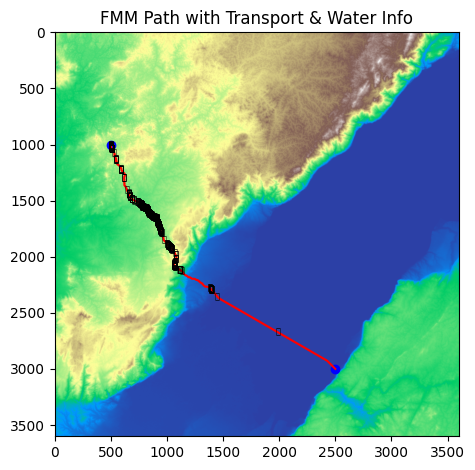

In [ ]:
import rasterio
import numpy as np
import skfmm
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd

# === Load elevation data ===
with rasterio.open("N01E030.hgt") as src:
    elevation = src.read(1).astype(np.float32)
    transform = src.transform
    crs = src.crs
    nodata = src.nodata

    if nodata is not None:
        elevation[elevation == nodata] = np.nan
    elevation = np.nan_to_num(elevation, nan=0)

# === Compute cost surface ===
dy, dx = np.gradient(elevation)
slope = np.sqrt(dx**2 + dy**2)
cost = 1 + slope

# === Set up Fast Marching ===
start = (1000, 500)
mask = np.ones_like(elevation, dtype=bool)
mask[start] = False

speed = 1 / (cost + 1e-6)
speed = np.where(speed <= 0, 1e-6, speed)

print("Running Fast Marching Method...")
arrival_time = skfmm.travel_time(mask.astype(float), speed)

# === Backtrace shortest arrival path ===
def backtrace_path(arrival, start, end, step_size=1.0):
    from scipy.ndimage import map_coordinates

    path = [end]
    y, x = end

    for _ in range(10000):
        gy, gx = np.gradient(arrival)
        norm = np.hypot(gx[y, x], gy[y, x])
        if norm == 0:
            break

        dx = -gx[y, x] / norm
        dy = -gy[y, x] / norm

        x_new = x + dx * step_size
        y_new = y + dy * step_size

        if not (0 <= x_new < arrival.shape[1] and 0 <= y_new < arrival.shape[0]):
            break

        x, y = int(round(x_new)), int(round(y_new))
        path.append((y, x))

        if (y, x) == start:
            break

    return path[::-1]

end = (3000, 2500)
path = backtrace_path(arrival_time, start, end)
path_y, path_x = zip(*path)

# === Convert path to geographic coordinates ===
coords = [rasterio.transform.xy(transform, y, x) for y, x in zip(path_y, path_x)]
path_points = gpd.GeoDataFrame(geometry=[Point(xy) for xy in coords], crs=crs)

# === Load transport and water GeoJSONs ===
transport = gpd.read_file("transport_network.geojson").to_crs(crs)
water = gpd.read_file("water_bodies.geojson").to_crs(crs)

# === Check intersections with buffer (~20m) ===
buffered_pts = path_points.buffer(0.0002)

transport_flags = buffered_pts.apply(lambda buf: transport.intersects(buf).any())
water_flags = buffered_pts.apply(lambda buf: water.intersects(buf).any())

# === Classify symbols ===
symbols = []
for t, w in zip(transport_flags, water_flags):
    if t and w:
        symbols.append("T+W")
    elif t:
        symbols.append("T")
    elif w:
        symbols.append("W")
    else:
        symbols.append(".")

# === Print stats ===
print(f"FMM Path length: {len(path)}")
print(f"Transport points: {sum(transport_flags)}, Water points: {sum(water_flags)}")

# === Visualize ===
plt.imshow(elevation, cmap='terrain')
plt.plot(path_x, path_y, color='red')
plt.scatter([start[1], end[1]], [start[0], end[0]], c='blue', label="Start/End")

# Overlay symbols
for i, (x, y) in enumerate(zip(path_x, path_y)):
    if symbols[i] == "T":
        plt.text(x, y, '🚗', fontsize=6, ha='center', va='center')
    elif symbols[i] == "W":
        plt.text(x, y, '🌊', fontsize=6, ha='center', va='center')
    elif symbols[i] == "T+W":
        plt.text(x, y, '⚓', fontsize=6, ha='center', va='center')

plt.title("FMM Path with Transport & Water Info")
plt.tight_layout()
plt.show()


#For N03

In [ ]:
import rasterio
import numpy as np
import skfmm
import matplotlib.pyplot as plt

# Load elevation data
with rasterio.open("N03E034.hgt") as src:
    elevation = src.read(1).astype(np.float32)
    transform = src.transform
    nodata = src.nodata

    if nodata is not None:
        elevation[elevation == nodata] = np.nan
    elevation = np.nan_to_num(elevation, nan=0)

    rows, cols = elevation.shape

# Compute slope as cost (you could enhance this)
dy, dx = np.gradient(elevation)
slope = np.sqrt(dx**2 + dy**2)
cost = 1 + slope

# Define source point for arrival map
start = (1000, 500)
mask = np.ones_like(elevation, dtype=bool)
mask[start] = False  # set source

# Use inverse cost as speed
speed = 1 / (cost + 1e-6)  # Avoid divide-by-zero
speed = np.where(speed <= 0, 1e-6, speed)

# Compute arrival time from source
print("Running Fast Marching Method...")
arrival_time = skfmm.travel_time(mask.astype(float), speed)

# Define target point
end = (3000, 2500)

# Backtrace shortest arrival path
def backtrace_path(arrival, start, end, step_size=1.0):
    from scipy.ndimage import map_coordinates

    path = [end]
    y, x = end

    for _ in range(10000):  # max iterations
        gy, gx = np.gradient(arrival)
        norm = np.hypot(gx[y, x], gy[y, x])
        if norm == 0:
            break

        dx = -gx[y, x] / norm
        dy = -gy[y, x] / norm

        x_new = x + dx * step_size
        y_new = y + dy * step_size

        if not (0 <= x_new < arrival.shape[1] and 0 <= y_new < arrival.shape[0]):
            break

        x, y = int(round(x_new)), int(round(y_new))
        path.append((y, x))

        if (y, x) == start:
            break

    return path[::-1]

path = backtrace_path(arrival_time, start, end)

# Visualize
plt.imshow(elevation, cmap='terrain')
path_y, path_x = zip(*path)
plt.plot(path_x, path_y, color='red')
plt.scatter([start[1], end[1]], [start[0], end[0]], c='blue')
plt.title("Fast Marching Path")
plt.show()


Running Fast Marching Method...


In [ ]:
import rasterio
import numpy as np
import skfmm
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd

# === Load elevation data ===
with rasterio.open("N03E034.hgt") as src:
    elevation = src.read(1).astype(np.float32)
    transform = src.transform
    crs = src.crs
    nodata = src.nodata

    if nodata is not None:
        elevation[elevation == nodata] = np.nan
    elevation = np.nan_to_num(elevation, nan=0)

# === Compute cost surface ===
dy, dx = np.gradient(elevation)
slope = np.sqrt(dx**2 + dy**2)
cost = 1 + slope

# === Set up Fast Marching ===
start = (1000, 500)
mask = np.ones_like(elevation, dtype=bool)
mask[start] = False

speed = 1 / (cost + 1e-6)
speed = np.where(speed <= 0, 1e-6, speed)

print("Running Fast Marching Method...")
arrival_time = skfmm.travel_time(mask.astype(float), speed)

# === Backtrace shortest arrival path ===
def backtrace_path(arrival, start, end, step_size=1.0):
    from scipy.ndimage import map_coordinates

    path = [end]
    y, x = end

    for _ in range(10000):
        gy, gx = np.gradient(arrival)
        norm = np.hypot(gx[y, x], gy[y, x])
        if norm == 0:
            break

        dx = -gx[y, x] / norm
        dy = -gy[y, x] / norm

        x_new = x + dx * step_size
        y_new = y + dy * step_size

        if not (0 <= x_new < arrival.shape[1] and 0 <= y_new < arrival.shape[0]):
            break

        x, y = int(round(x_new)), int(round(y_new))
        path.append((y, x))

        if (y, x) == start:
            break

    return path[::-1]

end = (3000, 2500)
path = backtrace_path(arrival_time, start, end)
path_y, path_x = zip(*path)

# === Convert path to geographic coordinates ===
coords = [rasterio.transform.xy(transform, y, x) for y, x in zip(path_y, path_x)]
path_points = gpd.GeoDataFrame(geometry=[Point(xy) for xy in coords], crs=crs)

# === Load transport and water GeoJSONs ===
transport = gpd.read_file("transport_network_n03.geojson").to_crs(crs)
water = gpd.read_file("water_bodies_n03.geojson").to_crs(crs)

# === Check intersections with buffer (~20m) ===
buffered_pts = path_points.buffer(0.0002)

transport_flags = buffered_pts.apply(lambda buf: transport.intersects(buf).any())
water_flags = buffered_pts.apply(lambda buf: water.intersects(buf).any())

# === Classify symbols ===
symbols = []
for t, w in zip(transport_flags, water_flags):
    if t and w:
        symbols.append("T+W")
    elif t:
        symbols.append("T")
    elif w:
        symbols.append("W")
    else:
        symbols.append(".")

# === Print stats ===
print(f"FMM Path length: {len(path)}")
print(f"Transport points: {sum(transport_flags)}, Water points: {sum(water_flags)}")

# === Visualize ===
plt.imshow(elevation, cmap='terrain')
plt.plot(path_x, path_y, color='red')
plt.scatter([start[1], end[1]], [start[0], end[0]], c='blue', label="Start/End")

# Overlay symbols
for i, (x, y) in enumerate(zip(path_x, path_y)):
    if symbols[i] == "T":
        plt.text(x, y, '🚗', fontsize=6, ha='center', va='center')
    elif symbols[i] == "W":
        plt.text(x, y, '🌊', fontsize=6, ha='center', va='center')
    elif symbols[i] == "T+W":
        plt.text(x, y, '⚓', fontsize=6, ha='center', va='center')

plt.title("FMM Path with Transport & Water Info")
plt.tight_layout()
plt.show()


#Approach 3 : Terrain Classification + Cost-Aware Routing

In [ ]:
!pip install numpy scipy rasterio matplotlib scikit-image

Path length: 2925, Total cost: 3920.96


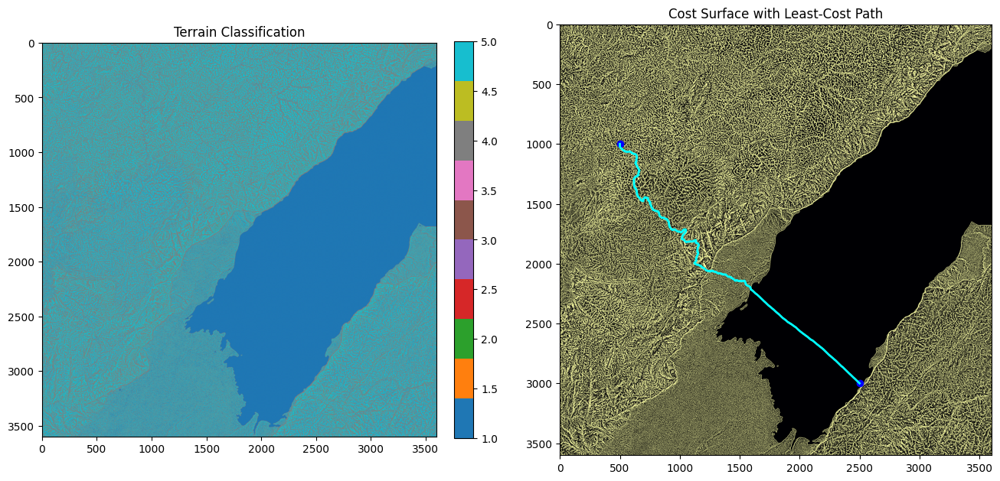

In [ ]:
import rasterio
import numpy as np
from scipy.ndimage import gaussian_filter
from skimage.graph import route_through_array
import matplotlib.pyplot as plt

# Load elevation data
with rasterio.open("N01E030.hgt") as src:
    elevation = src.read(1).astype(np.float32)
    transform = src.transform
    nodata = src.nodata

    if nodata is not None:
        elevation[elevation == nodata] = np.nan
    elevation = np.nan_to_num(elevation, nan=0)

# Smooth elevation to reduce noise
smoothed = gaussian_filter(elevation, sigma=1)

# Compute slope and curvature
gy, gx = np.gradient(smoothed)
slope = np.sqrt(gx**2 + gy**2)

gxx = np.gradient(gx, axis=1)
gyy = np.gradient(gy, axis=0)
curvature = gxx + gyy

# Terrain classification
terrain_class = np.zeros_like(elevation, dtype=np.uint8)
terrain_class[slope < 5] = 1      # flat
terrain_class[(slope >= 5) & (slope < 15)] = 2  # gentle slope
terrain_class[slope >= 15] = 3    # steep slope

# Increase cost on ridges and cliffs
terrain_class[curvature > 0.1] = 4   # ridge
terrain_class[curvature < -0.1] = 5  # valley

# Build cost surface based on classes
cost = np.ones_like(elevation, dtype=np.float32)

cost[terrain_class == 2] = 5     # moderate cost for gentle slope
cost[terrain_class == 3] = 20    # high cost for steep slopes
cost[terrain_class == 4] = 50    # very high cost on ridges
cost[terrain_class == 5] = 1     # low cost in valleys

# Optional: add small noise to avoid flat cost plateaus
cost += 0.01 * np.random.rand(*cost.shape)

# Define start and end points (row, col)
start = (1000, 500)
end = (3000, 2500)

# Calculate least-cost path on CPU
indices, weight = route_through_array(cost, start, end, fully_connected=True)
path_y, path_x = zip(*indices)

print(f"Path length: {len(indices)}, Total cost: {weight:.2f}")

# Visualize classification and path
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# Terrain classification map
cmap = plt.get_cmap('tab10')
im = ax[0].imshow(terrain_class, cmap=cmap)
ax[0].set_title("Terrain Classification")
fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)

# Cost surface with path overlay
ax[1].imshow(cost, cmap='inferno')
ax[1].plot(path_x, path_y, 'cyan', linewidth=2)
ax[1].scatter([start[1], end[1]], [start[0], end[0]], c='blue', marker='o')
ax[1].set_title("Cost Surface with Least-Cost Path")

plt.show()


Path length: 3091, Total cost: 3715.12


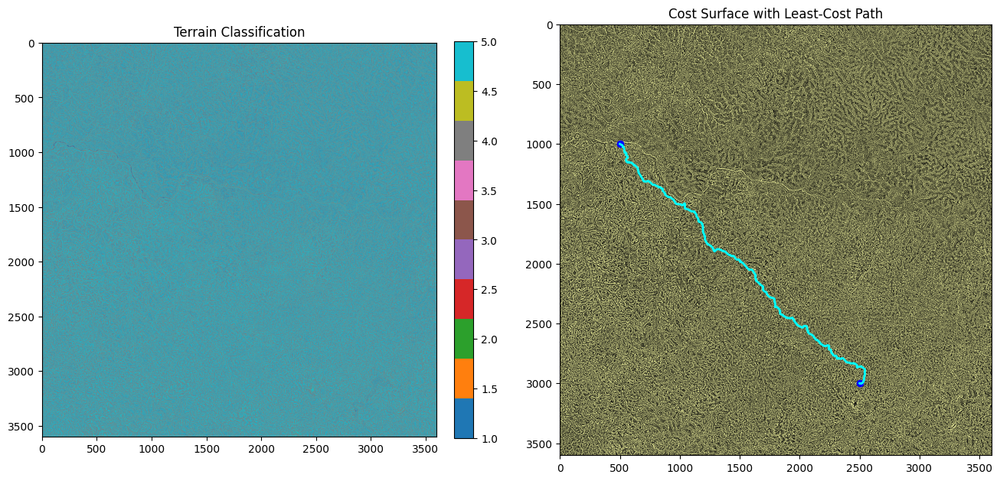

In [ ]:
import rasterio
import numpy as np
from scipy.ndimage import gaussian_filter
from skimage.graph import route_through_array
import matplotlib.pyplot as plt

# Load elevation data
with rasterio.open("N03E028.hgt") as src:
    elevation = src.read(1).astype(np.float32)
    transform = src.transform
    nodata = src.nodata

    if nodata is not None:
        elevation[elevation == nodata] = np.nan
    elevation = np.nan_to_num(elevation, nan=0)

# Smooth elevation to reduce noise
smoothed = gaussian_filter(elevation, sigma=1)

# Compute slope and curvature
gy, gx = np.gradient(smoothed)
slope = np.sqrt(gx**2 + gy**2)

gxx = np.gradient(gx, axis=1)
gyy = np.gradient(gy, axis=0)
curvature = gxx + gyy

# Terrain classification
terrain_class = np.zeros_like(elevation, dtype=np.uint8)
terrain_class[slope < 5] = 1      # flat
terrain_class[(slope >= 5) & (slope < 15)] = 2  # gentle slope
terrain_class[slope >= 15] = 3    # steep slope

# Increase cost on ridges and cliffs
terrain_class[curvature > 0.1] = 4   # ridge
terrain_class[curvature < -0.1] = 5  # valley

# Build cost surface based on classes
cost = np.ones_like(elevation, dtype=np.float32)

cost[terrain_class == 2] = 5     # moderate cost for gentle slope
cost[terrain_class == 3] = 20    # high cost for steep slopes
cost[terrain_class == 4] = 50    # very high cost on ridges
cost[terrain_class == 5] = 1     # low cost in valleys

# Optional: add small noise to avoid flat cost plateaus
cost += 0.01 * np.random.rand(*cost.shape)

# Define start and end points (row, col)
start = (1000, 500)
end = (3000, 2500)

# Calculate least-cost path on CPU
indices, weight = route_through_array(cost, start, end, fully_connected=True)
path_y, path_x = zip(*indices)

print(f"Path length: {len(indices)}, Total cost: {weight:.2f}")

# Visualize classification and path
fig, ax = plt.subplots(1, 2, figsize=(16, 8))

# Terrain classification map
cmap = plt.get_cmap('tab10')
im = ax[0].imshow(terrain_class, cmap=cmap)
ax[0].set_title("Terrain Classification")
fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)

# Cost surface with path overlay
ax[1].imshow(cost, cmap='inferno')
ax[1].plot(path_x, path_y, 'cyan', linewidth=2)
ax[1].scatter([start[1], end[1]], [start[0], end[0]], c='blue', marker='o')
ax[1].set_title("Cost Surface with Least-Cost Path")

plt.show()


In [ ]:
import rasterio
import numpy as np
from scipy.ndimage import gaussian_filter
from skimage.graph import route_through_array
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd

# Load elevation data
with rasterio.open("N01E030.hgt") as src:
    elevation = src.read(1).astype(np.float32)
    transform = src.transform
    crs = src.crs
    nodata = src.nodata

    if nodata is not None:
        elevation[elevation == nodata] = np.nan
    elevation = np.nan_to_num(elevation, nan=0)

# Smooth elevation to reduce noise
smoothed = gaussian_filter(elevation, sigma=1)

# Compute slope and curvature
gy, gx = np.gradient(smoothed)
slope = np.sqrt(gx**2 + gy**2)
gxx = np.gradient(gx, axis=1)
gyy = np.gradient(gy, axis=0)
curvature = gxx + gyy

# Terrain classification
terrain_class = np.zeros_like(elevation, dtype=np.uint8)
terrain_class[slope < 5] = 1      # flat
terrain_class[(slope >= 5) & (slope < 15)] = 2  # gentle slope
terrain_class[slope >= 15] = 3    # steep slope
terrain_class[curvature > 0.1] = 4   # ridge
terrain_class[curvature < -0.1] = 5  # valley

# Build cost surface
cost = np.ones_like(elevation, dtype=np.float32)
cost[terrain_class == 2] = 5
cost[terrain_class == 3] = 20
cost[terrain_class == 4] = 50
cost[terrain_class == 5] = 1
cost += 0.01 * np.random.rand(*cost.shape)

# Define start and end points (row, col)
start = (1000, 500)
end = (3000, 2500)

# Compute least-cost path
indices, weight = route_through_array(cost, start, end, fully_connected=True)
path_y, path_x = zip(*indices)

# Convert pixel indices to geographic coordinates
coords = [rasterio.transform.xy(transform, y, x) for y, x in zip(path_y, path_x)]
path_points = gpd.GeoDataFrame(geometry=[Point(xy) for xy in coords], crs=crs)

# Load transport and water body layers (GeoJSON, Shapefile etc.)
transport = gpd.read_file("transport_network.geojson").to_crs(crs)
water = gpd.read_file("water_bodies.geojson").to_crs(crs)

# Check intersection at each path point
transport_flags = path_points.geometry.apply(lambda pt: transport.intersects(pt).any())
water_flags = path_points.geometry.apply(lambda pt: water.intersects(pt).any())

# Classify symbols for visualization
symbols = []
for t, w in zip(transport_flags, water_flags):
    if t and w:
        symbols.append("T+W")  # Both transport and water
    elif t:
        symbols.append("T")    # Transport only
    elif w:
        symbols.append("W")    # Water only
    else:
        symbols.append(".")

# Print some stats
print(f"Path length: {len(indices)}, Total cost: {weight:.2f}")
print(f"Transport points: {sum(transport_flags)}, Water points: {sum(water_flags)}")

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(18, 9))

# Terrain classification
cmap = plt.get_cmap('tab10')
im = ax[0].imshow(terrain_class, cmap=cmap)
ax[0].set_title("Terrain Classification")
fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)

# Cost surface with path
ax[1].imshow(cost, cmap='inferno')
ax[1].plot(path_x, path_y, 'cyan', linewidth=2)
ax[1].scatter([start[1], end[1]], [start[0], end[0]], c='blue', marker='o')

# Overlay symbols
for i, (x, y) in enumerate(zip(path_x, path_y)):
    if symbols[i] == "T":
        ax[1].text(x, y, '🚗', fontsize=6, ha='center', va='center')
    elif symbols[i] == "W":
        ax[1].text(x, y, '🌊', fontsize=6, ha='center', va='center')
    elif symbols[i] == "T+W":
        ax[1].text(x, y, '⚓', fontsize=6, ha='center', va='center')

ax[1].set_title("Cost Surface with Least-Cost Path & Transport Info")
plt.tight_layout()
plt.show()


<ipython-input-3-852d95bd8d01>:66: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffered_pts = path_points.buffer(0.0002)  # ~20 meters


Path length: 2925, Total cost: 3921.27
Transport points: 531, Water points: 10


<ipython-input-3-852d95bd8d01>:110: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
<ipython-input-3-852d95bd8d01>:110: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128663 (\N{AUTOMOBILE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127754 (\N{WATER WAVE}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


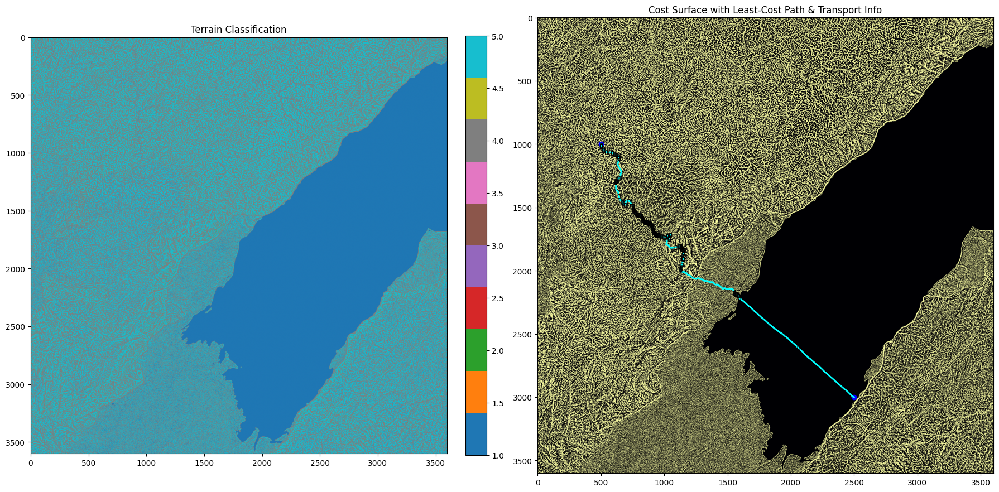

In [ ]:
import rasterio
import numpy as np
from scipy.ndimage import gaussian_filter
from skimage.graph import route_through_array
import matplotlib.pyplot as plt
from shapely.geometry import Point
import geopandas as gpd

# === Load elevation data (DEM) ===
with rasterio.open("N01E030.hgt") as src:
    elevation = src.read(1).astype(np.float32)
    transform = src.transform
    crs = src.crs
    nodata = src.nodata

    if nodata is not None:
        elevation[elevation == nodata] = np.nan
    elevation = np.nan_to_num(elevation, nan=0)

# === Smooth elevation to reduce noise ===
smoothed = gaussian_filter(elevation, sigma=1)

# === Compute slope and curvature ===
gy, gx = np.gradient(smoothed)
slope = np.sqrt(gx**2 + gy**2)
gxx = np.gradient(gx, axis=1)
gyy = np.gradient(gy, axis=0)
curvature = gxx + gyy

# === Terrain classification ===
terrain_class = np.zeros_like(elevation, dtype=np.uint8)
terrain_class[slope < 5] = 1      # flat
terrain_class[(slope >= 5) & (slope < 15)] = 2  # gentle slope
terrain_class[slope >= 15] = 3    # steep slope
terrain_class[curvature > 0.1] = 4   # ridge
terrain_class[curvature < -0.1] = 5  # valley

# === Build cost surface ===
cost = np.ones_like(elevation, dtype=np.float32)
cost[terrain_class == 2] = 5
cost[terrain_class == 3] = 20
cost[terrain_class == 4] = 50
cost[terrain_class == 5] = 1
cost += 0.01 * np.random.rand(*cost.shape)  # Small noise

# === Define start and end points ===
start = (1000, 500)
end = (3000, 2500)

# === Compute least-cost path ===
indices, weight = route_through_array(cost, start, end, fully_connected=True)
path_y, path_x = zip(*indices)

# === Convert pixel indices to geographic coordinates ===
coords = [rasterio.transform.xy(transform, y, x) for y, x in zip(path_y, path_x)]
path_points = gpd.GeoDataFrame(geometry=[Point(xy) for xy in coords], crs=crs)

# === Load GeoJSON layers ===
transport = gpd.read_file("transport_network.geojson").to_crs(crs)
water = gpd.read_file("water_bodies.geojson").to_crs(crs)

# === Check CRS compatibility ===
assert path_points.crs == transport.crs == water.crs, "CRS mismatch detected."

# === Buffered intersection check (more reliable) ===
buffered_pts = path_points.buffer(0.0002)  # ~20 meters
transport_flags = buffered_pts.apply(lambda buf: transport.intersects(buf).any())
water_flags = buffered_pts.apply(lambda buf: water.intersects(buf).any())

# === Symbol classification for visualization ===
symbols = []
for t, w in zip(transport_flags, water_flags):
    if t and w:
        symbols.append("T+W")
    elif t:
        symbols.append("T")
    elif w:
        symbols.append("W")
    else:
        symbols.append(".")

# === Print results ===
print(f"Path length: {len(indices)}, Total cost: {weight:.2f}")
print(f"Transport points: {sum(transport_flags)}, Water points: {sum(water_flags)}")

# === Plotting ===
fig, ax = plt.subplots(1, 2, figsize=(18, 9))

# Terrain classification
cmap = plt.get_cmap('tab10')
im = ax[0].imshow(terrain_class, cmap=cmap)
ax[0].set_title("Terrain Classification")
fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)

# Cost surface with path
ax[1].imshow(cost, cmap='inferno')
ax[1].plot(path_x, path_y, 'cyan', linewidth=2)
ax[1].scatter([start[1], end[1]], [start[0], end[0]], c='blue', marker='o')

# Overlay symbols
for i, (x, y) in enumerate(zip(path_x, path_y)):
    if symbols[i] == "T":
        ax[1].text(x, y, '🚗', fontsize=6, ha='center', va='center')
    elif symbols[i] == "W":
        ax[1].text(x, y, '🌊', fontsize=6, ha='center', va='center')
    elif symbols[i] == "T+W":
        ax[1].text(x, y, '⚓', fontsize=6, ha='center', va='center')

ax[1].set_title("Cost Surface with Least-Cost Path & Transport Info")
plt.tight_layout()
plt.show()


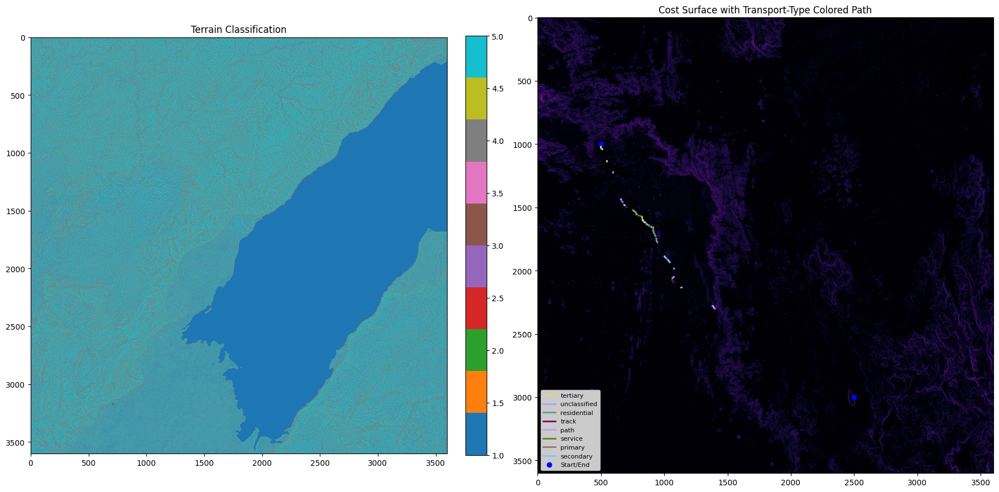

In [9]:
from matplotlib.colors import to_rgba
import random

# Match each point with transport feature type (e.g., highway type)
def get_transport_type(pt_geom):
    for feature in transport.itertuples():
        if feature.geometry.intersects(pt_geom):
            return feature.highway if hasattr(feature, 'highway') else 'unknown'
    return None

# Get transport types for each buffered point
transport_types = [get_transport_type(buf) for buf in buffered_pts]

# Group continuous segments by transport type
segments = []
current_segment = {'type': transport_types[0], 'coords': [(path_x[0], path_y[0])]}

for i in range(1, len(path_x)):
    curr_type = transport_types[i]
    prev_type = current_segment['type']

    if curr_type == prev_type:
        current_segment['coords'].append((path_x[i], path_y[i]))
    else:
        segments.append(current_segment)
        current_segment = {'type': curr_type, 'coords': [(path_x[i-1], path_y[i]), (path_x[i], path_y[i])]}

segments.append(current_segment)

# Assign random colors for each transport type
unique_types = list(set(seg['type'] for seg in segments))
type_colors = {t: to_rgba(np.random.rand(3,), alpha=1.0) for t in unique_types}

# === Plotting ===
fig, ax = plt.subplots(1, 2, figsize=(18, 9))

# Terrain classification
cmap = plt.get_cmap('tab10')
im = ax[0].imshow(terrain_class, cmap=cmap)
ax[0].set_title("Terrain Classification")
fig.colorbar(im, ax=ax[0], fraction=0.046, pad=0.04)

# Cost surface with path segments
ax[1].imshow(cost, cmap='inferno')

# Draw color-coded segments
for segment in segments:
    if segment['type'] is not None:
        xs, ys = zip(*segment['coords'])
        ax[1].plot(xs, ys, color=type_colors[segment['type']], linewidth=2, label=segment['type'])

# Mark start/end points
ax[1].scatter([start[1], end[1]], [start[0], end[0]], c='blue', marker='o', label='Start/End')

# Avoid duplicate legend entries
handles, labels = ax[1].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
ax[1].legend(by_label.values(), by_label.keys(), loc='lower left', fontsize=8)

ax[1].set_title("Cost Surface with Transport-Type Colored Path")
plt.tight_layout()
plt.show()


#Downlaoder

In [ ]:
!pip install osmnx geopandas rasterio shapely


In [ ]:
!pip install osmnx==1.6.0


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.4/101.4 kB 1.9 MB/s eta 0:00:00
  Attempting uninstall: osmnx
    Found existing installation: osmnx 2.0.3
    Uninstalling osmnx-2.0.3:
      Successfully uninstalled osmnx-2.0.3


In [ ]:
import rasterio
import osmnx as ox

dem_path = "N01E030.hgt"

with rasterio.open(dem_path) as src:
    bounds = src.bounds

north, south, east, west = bounds.top, bounds.bottom, bounds.right, bounds.left

# Pass bbox as keyword arguments, NOT positional
G = ox.graph_from_bbox(north, south, east, west, network_type='drive')


# Convert graph to GeoDataFrame
transport = ox.graph_to_gdfs(G, nodes=False)
transport.to_file("transport_network.geojson", driver="GeoJSON")

print("Done!")


TypeError: graph_from_bbox() takes 1 positional argument but 4 positional arguments (and 1 keyword-only argument) were given

In [ ]:
import osmnx as ox
print(ox.__version__)


2.0.3
